# Neural Net - Testing Our Model on Sentinel-2 TCI Imagery

In [1]:
import sys
sys.path.insert(1,'../')
import rasterio
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
plt.rcParams.update({'figure.max_open_warning': 0})
import numpy as np
import math
import warnings
from tqdm import tqdm, trange
from raster_data import RasterData
from display import __normalize_array as norm
from model_architecture import Net, ResNet50, ResNet101, ResNet151

warnings.filterwarnings("ignore")

## Converting jp2 to numpy array

In [2]:
def get_numpy_array(image):
    img = rasterio.open(image)
    final_image = np.zeros([*img.shape, 3]).astype(np.uint16)
    final_image[:,:,0] = img.read(1)
    final_image[:,:,1] = img.read(2)
    final_image[:,:,2] = img.read(3)

    return final_image

## Useful Methods For Data Creation

In [3]:
def get_remainder_shape(y,x,z):
    y -= y % 64
    x -= x % 64
    return y,x
            
def get_64_based_image(arr):
    y, x = get_remainder_shape(*arr.shape)
    return arr[:y, :x, :]

def get_blocks(arr):
    arr = get_64_based_image(arr)
    img_shape = arr.shape
    tile_size = (64, 64)
    offset = (64, 64)
    ll = []
    for i in range(int(math.ceil(img_shape[0]/(offset[1] * 1.0)))):
        for j in range(int(math.ceil(img_shape[1]/(offset[0] * 1.0)))):
            ll.append((arr[offset[1]*i:min(offset[1]*i+tile_size[1],
                                                       img_shape[0]), 
                                       offset[0]*j:min(offset[0]*j+tile_size[0], 
                                                       img_shape[1])]))

    return np.array(ll)
    
def get_net_input(arr):
    in_data = get_blocks(arr)
    in_data = np.swapaxes(in_data, 1,3)
    in_data = np.swapaxes(in_data, 2,3)
    return in_data

def normalize_image(arr):
    arr = arr - arr.mean()
    std = np.std(arr)
    return (arr/std)

In [4]:
correspondance = {
    'AnnualCrop': 'wheat',
    'Forest': 'darkgreen',
    'HerbaceousVegetation': 'green',
    'Highway': 'grey',
    'Industrial': 'darkgrey',
    'Pasture': 'lightgreen',
    'PermanentCrop': 'orange',
    'Residential': 'yellow',
    'River': 'lightblue',
    'Sealake': 'darkblue'
}

developped = {
    'AnnualCrop': 'wheat',
    'Forest': 'green',
    'HerbaceousVegetation': 'green',
    'Highway': 'grey',
    'Industrial': 'darkgrey',
    'Pasture': 'lightgreen',
    'PermanentCrop': 'orange',
    'Residential': 'yellow',
    'River': 'blue',
    'Sealake': 'blue'
}

my_colors = {
    'AnnualCrop': 0,
    'Forest': 1,
    'HerbaceousVegetation': 2,
    'Highway': 3,
    'Industrial': 4,
    'Pasture': 5,
    'PermanentCrop': 6,
    'Residential': 7,
    'River': 8,
    'Sealake': 9
}



classes = correspondance.keys()
class_list = list(classes)
custom_cmap = ListedColormap(correspondance.values())
patches = [mpatches.Patch(color=custom_cmap(v), label=k) for k,v in sorted(my_colors.items(), key=lambda t: t[0])]

In [5]:
def get_ground_percentages(pred):
    flat_list = [item for sublist in pred for item in sublist]
    flat_arr = np.array(flat_list)
    index, values = np.unique(flat_arr, return_counts=True)
    sum_of_values = np.sum(values)
    result = ''
    my_classes = list(classes)
    for i in range(10):
        result += '{}: {:.2f}%\n'.format(my_classes[i], (100*values[i]/sum_of_values))
    
    return result
#     return [100*v/sum_of_values for v in values]

# Loading Our Neural Net

In [8]:
device = torch.device('cpu')
model = ResNet101().to(device)
# model.load_state_dict(torch.load('../../models/25100_epoch_Resnet50.pt', map_location=device))
model.load_state_dict(torch.load('../../models/25epoch_Resnet50.pt', map_location=device))
# model.load_state_dict(torch.load('../../models/30epoch_Resnet151.pt', map_location=device))

model = model.float()

In [9]:
def get_predicitons(in_data):
    in_data = torch.from_numpy(in_data).float()
    output = []
    model.eval()
    chunk_size = 500
    max_size = in_data.shape[0]
    with torch.no_grad():
        for i in trange(int(max_size / chunk_size + 1), desc='Chunk'):
            output.append(model(in_data[i*chunk_size:(i+1)*chunk_size,:]).
                          argmax(1).tolist())

    return output

In [10]:
def plot_result(output, org_shape, title='No Title',loc=4, save=False):
    y, x = get_remainder_shape(*org_shape)
    flat_list = [item for sublist in output for item in sublist]
    square = np.array(flat_list).reshape(int(y/64), int(x/64))
    finished = square.repeat(64, axis=0).repeat(64, axis=1)
    plt.figure(figsize=(10,14))
    plt.imshow(finished, cmap=custom_cmap)
    plt.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
    plt.legend(handles=patches, loc=loc, fontsize=22)
    plt.tight_layout()
    if save:
        plt.savefig('../../figures/{}.png'.format(title), dpi= 600)

# Montreal, Canada

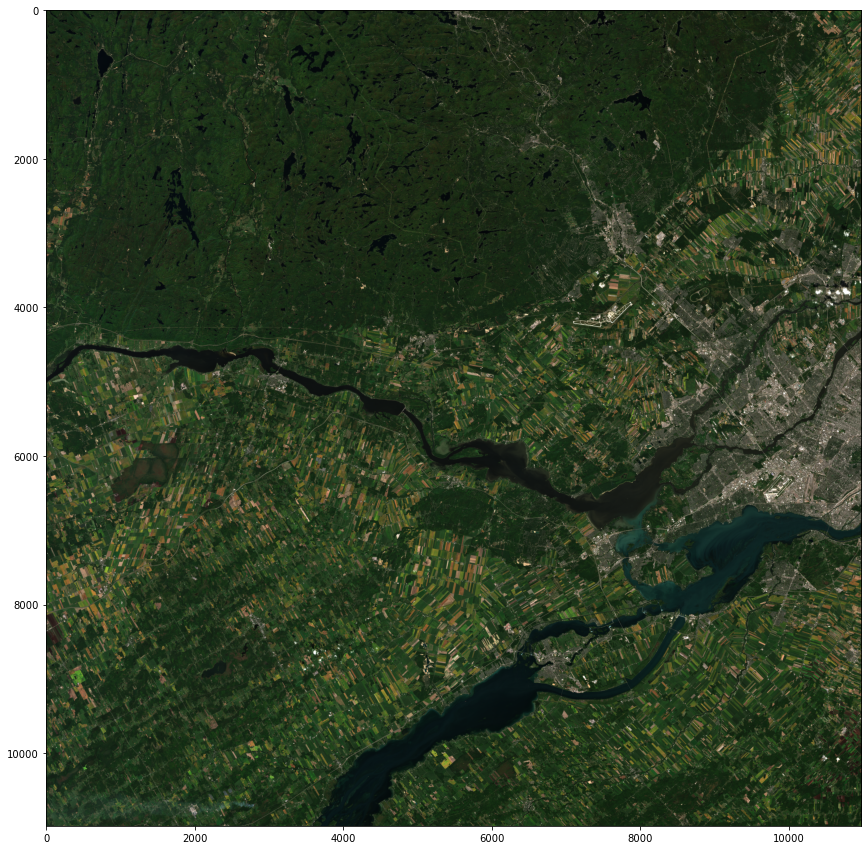

In [32]:
rgb_path = '../../images/montreal.jp2'
img = get_numpy_array(rgb_path)
org_shape = img.shape
plt.figure(figsize=(15,15))
plt.imshow(img)

In [33]:
input_data = get_net_input(normalize_image(img))

In [34]:
pred = get_predicitons(input_data)

Chunk: 100%|██████████| 59/59 [02:04<00:00,  2.11s/it]


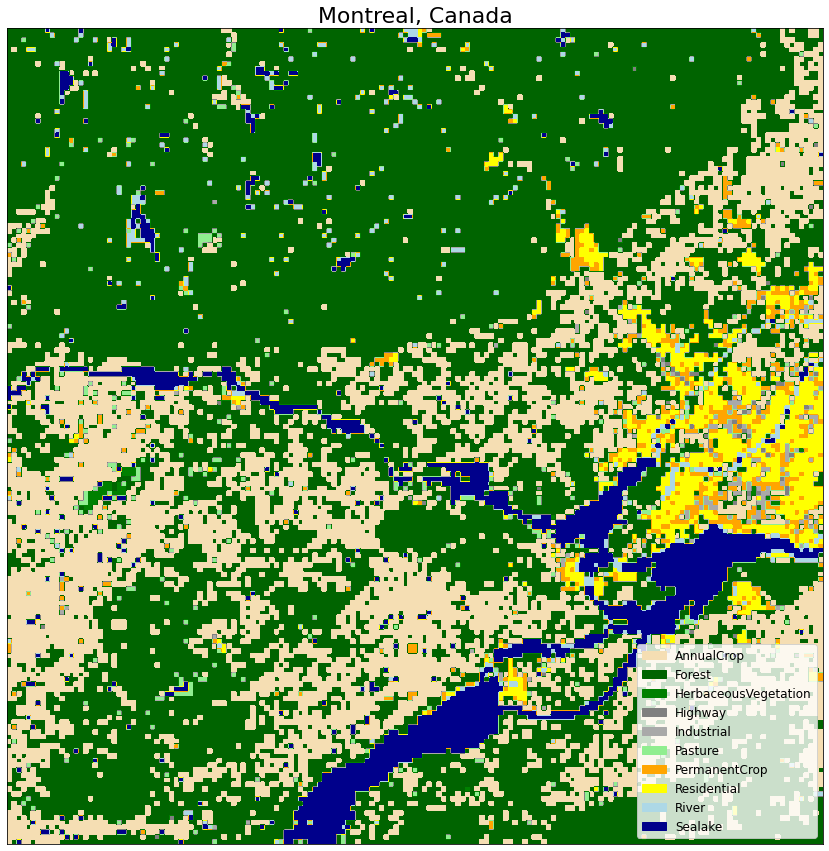

In [35]:
plot_result(pred, org_shape, 'Montreal, Canada')

In [84]:
percentages = get_ground_percentages(pred)
dict(zip(class_list, percentages))

{'AnnualCrop': 35.85376697103382,
 'Forest': 25.6899558838617,
 'HerbaceousVegetation': 0.0068397113641804315,
 'Highway': 5.006668718580076,
 'Industrial': 0.33514585684484116,
 'Pasture': 13.823056667008652,
 'PermanentCrop': 1.8433022126466263,
 'Residential': 1.5320953455764166,
 'River': 3.5737491877842755,
 'Sealake': 12.335419445299408}

# Venice, Italy

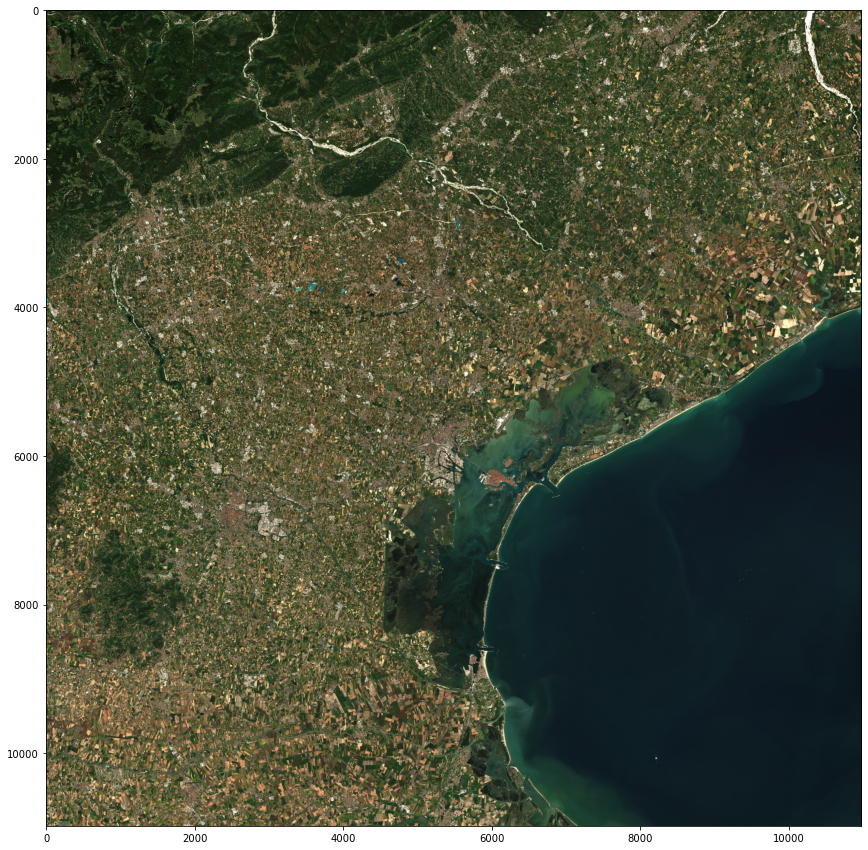

In [17]:
rgb_path = '../../images/venice.jp2'
img = get_numpy_array(rgb_path)
org_shape = img.shape
plt.figure(figsize=(15,15))
plt.imshow(img)

Chunk: 100%|██████████| 59/59 [02:03<00:00,  2.10s/it]


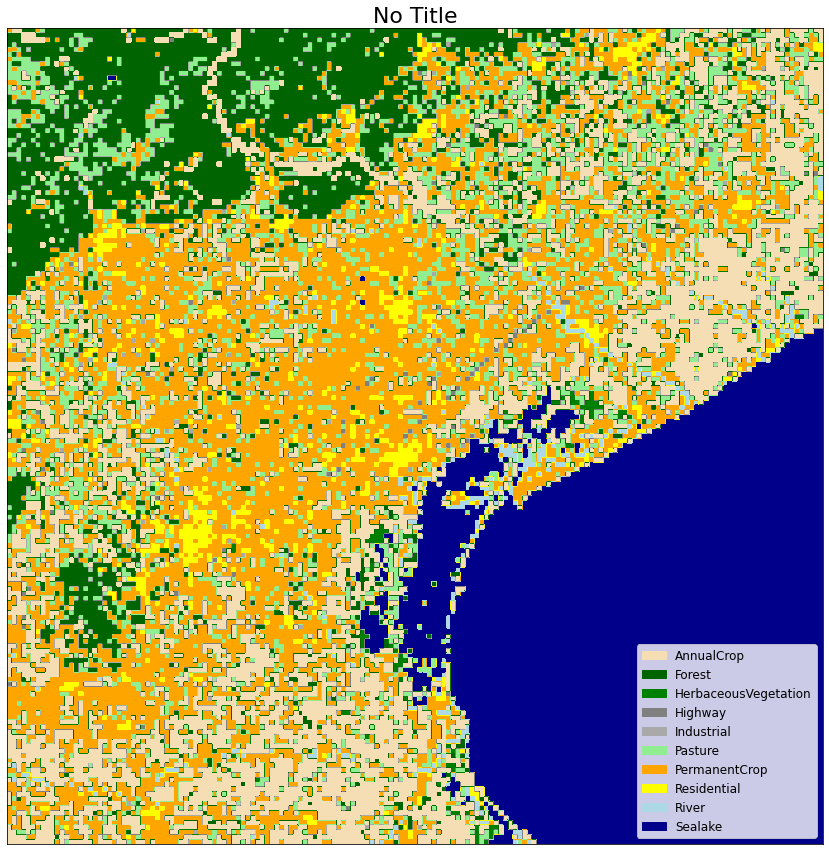

In [18]:
input_data = get_net_input(normalize_image(img))
pred = get_predicitons(input_data)
plot_result(pred, org_shape, title='Venice Italy')

# Darmstadt, Germany

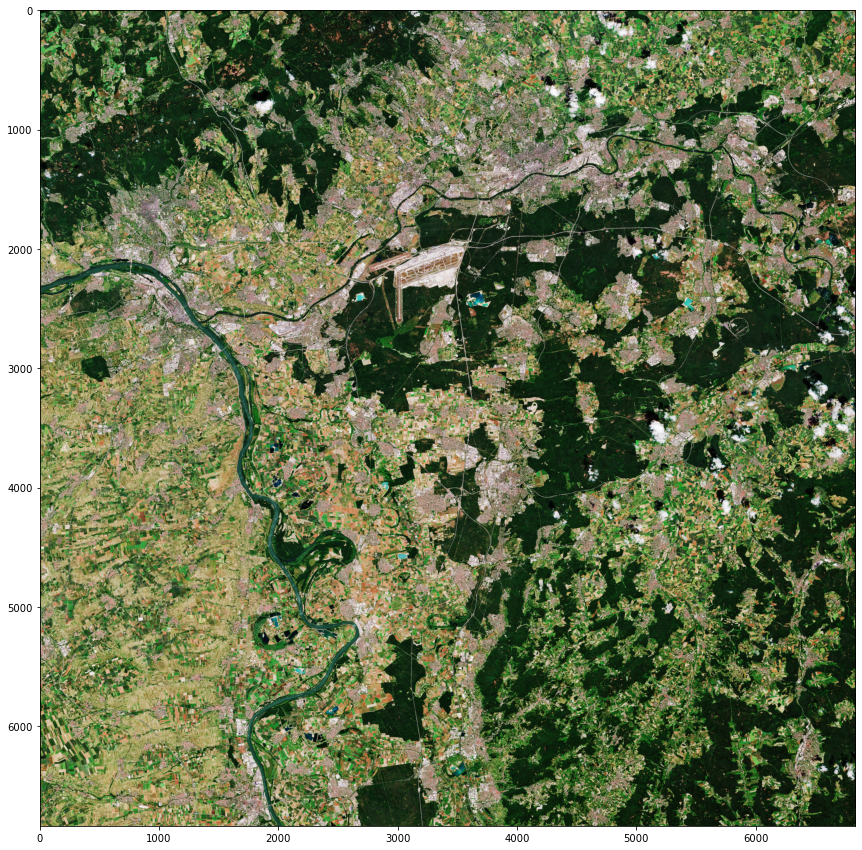

In [20]:
rgb_path = '../../images/Darmstadt.tif'
germany = plt.imread(rgb_path)
org_shape = germany.shape
plt.figure(figsize=(15,15))
plt.imshow(germany)

Chunk: 100%|██████████| 23/23 [00:45<00:00,  1.99s/it]


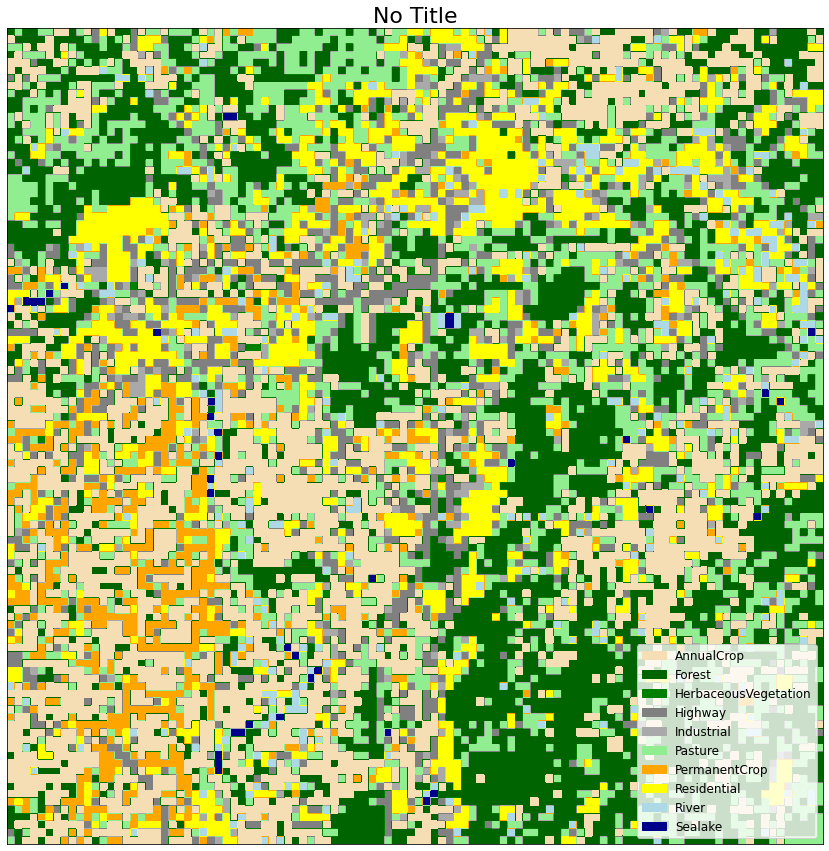

In [21]:
input_data = get_net_input(normalize_image(germany))
pred = get_predicitons(input_data)
plot_result(pred, org_shape)

# Zeeland, Netherlands

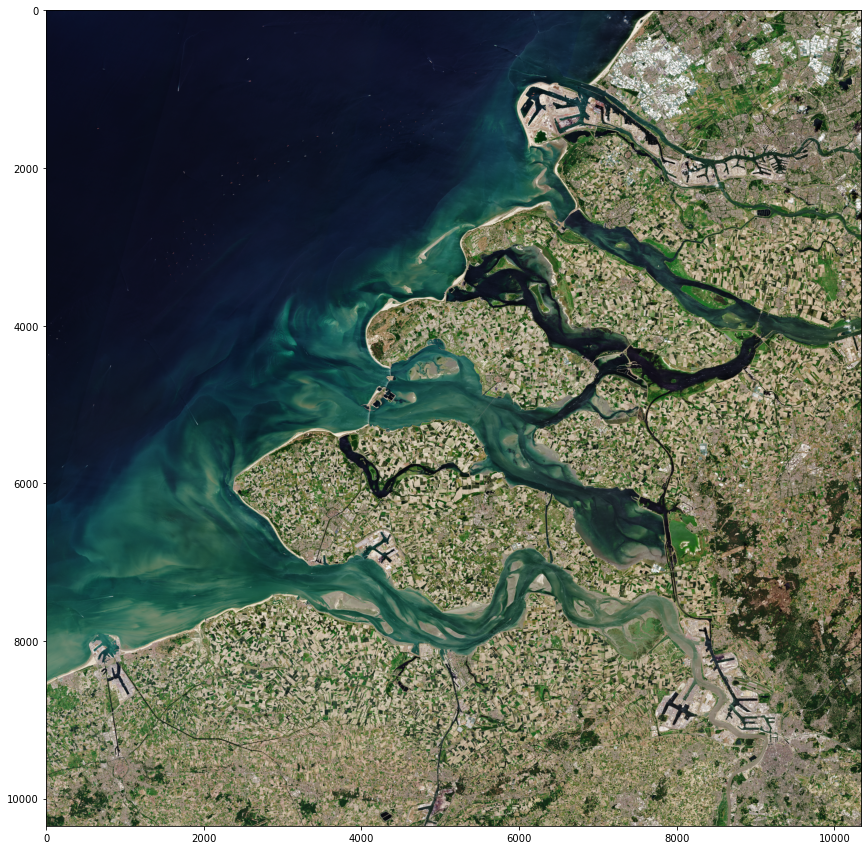

In [24]:
rgb_path = '../../images/zeeland.tif'
netherlands = plt.imread(rgb_path)
org_shape = netherlands.shape
plt.figure(figsize=(15,15))
plt.imshow(netherlands)

In [22]:
input_data = get_net_input(normalize_image(netherlands))

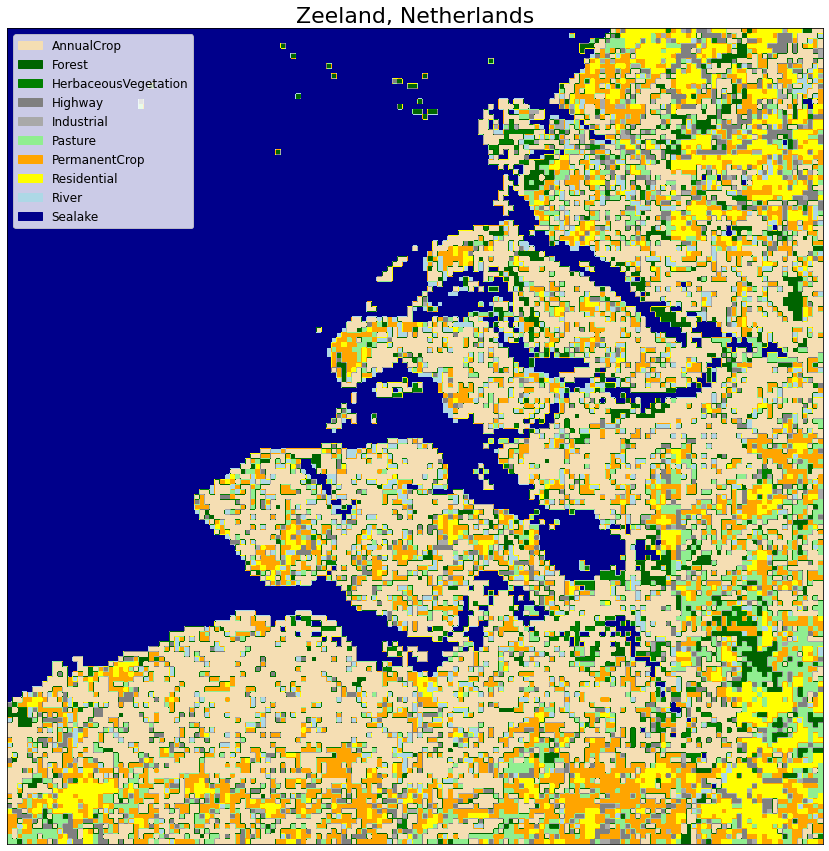

In [25]:
pred = get_predicitons(input_data)
plot_result(pred, org_shape,'Zeeland, Netherlands', loc=2)

# San Francisco, California

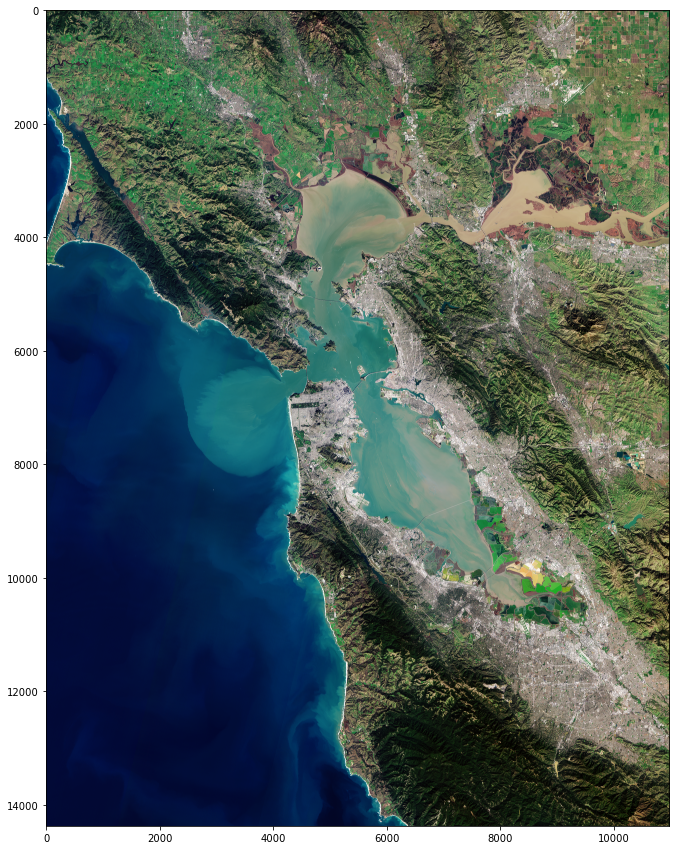

In [11]:
rgb_path = '../../images/sanfrancisco.tif'
sanfran = plt.imread(rgb_path)
org_shape = sanfran.shape
plt.figure(figsize=(15,15))
plt.imshow(sanfran);

In [12]:
input_data = get_net_input(normalize_image(sanfran))
pred = get_predicitons(input_data)

Chunk: 100%|██████████| 77/77 [04:01<00:00,  3.13s/it]


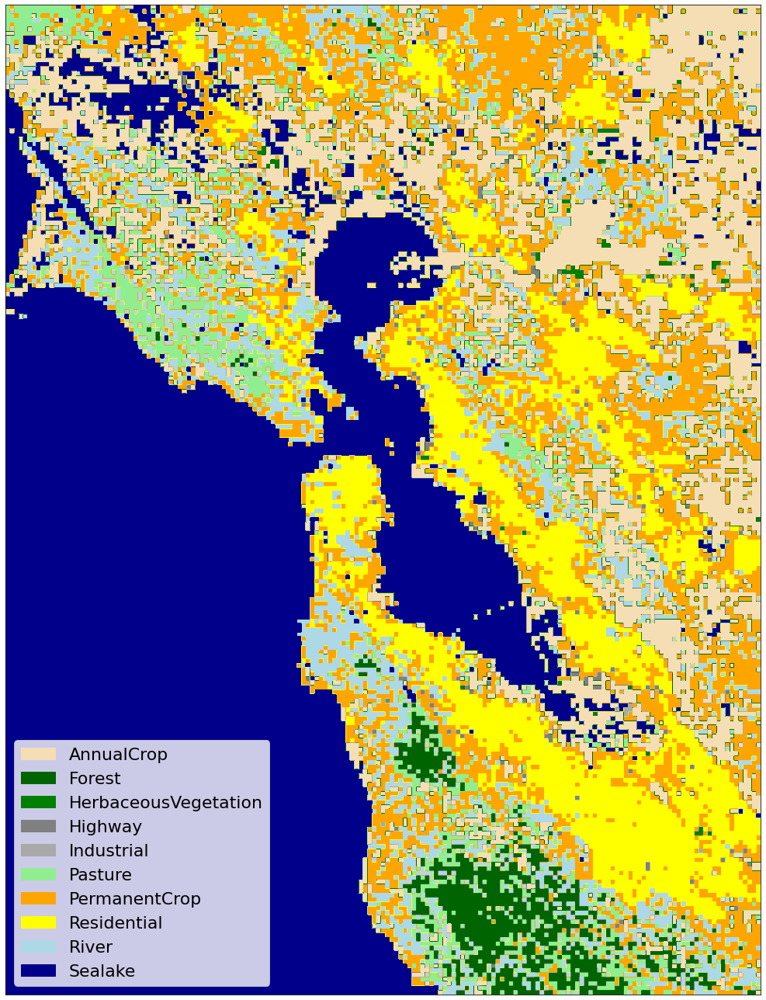

In [13]:
plot_result(pred, org_shape, 'San Francisco, California', loc=3, save=False)

In [14]:
print(get_ground_percentages(pred))

AnnualCrop: 16.82%
Forest: 2.52%
HerbaceousVegetation: 0.18%
Highway: 0.46%
Industrial: 0.02%
Pasture: 4.22%
PermanentCrop: 18.56%
Residential: 11.23%
River: 8.84%
Sealake: 37.14%



In [39]:
print(get_ground_percentagespercentages(pred))

AnnualCrop: 12.19%
Forest: 2.53%
HerbaceousVegetation: 0.51%
Highway: 1.91%
Industrial: 0.14%
Pasture: 15.21%
PermanentCrop: 16.67%
Residential: 10.52%
River: 3.22%
Sealake: 37.11%



# Barcelona, Spain

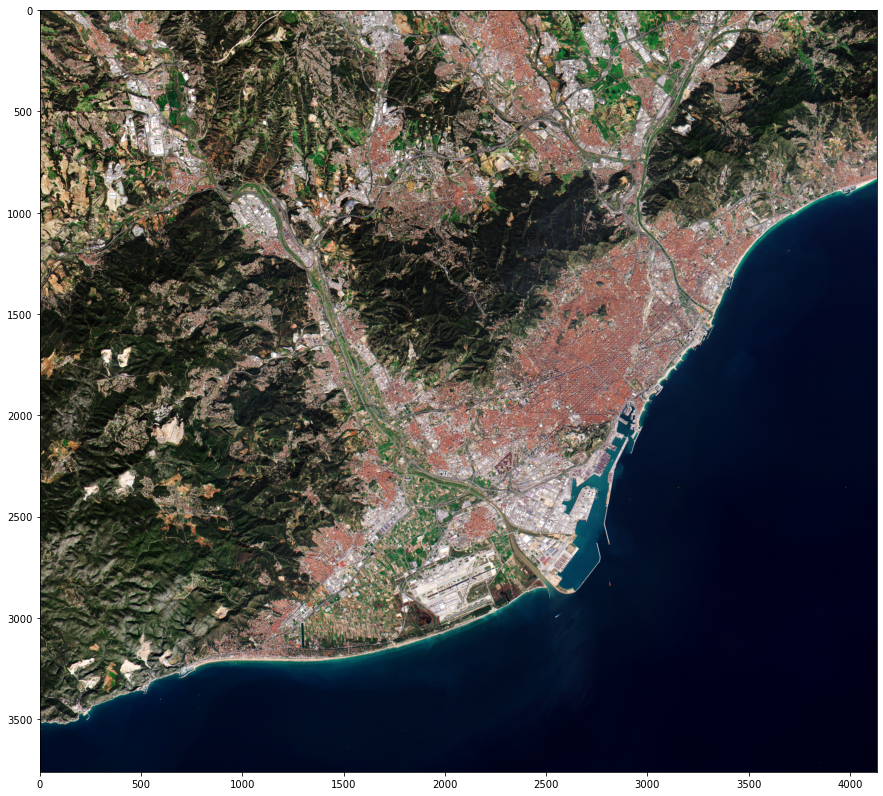

In [15]:
rgb_path = '../../images/barcelona.tif'
img = plt.imread(rgb_path)
org_shape = img.shape
plt.figure(figsize=(15,15))
plt.imshow(img);

Chunk: 100%|██████████| 8/8 [00:16<00:00,  2.02s/it]


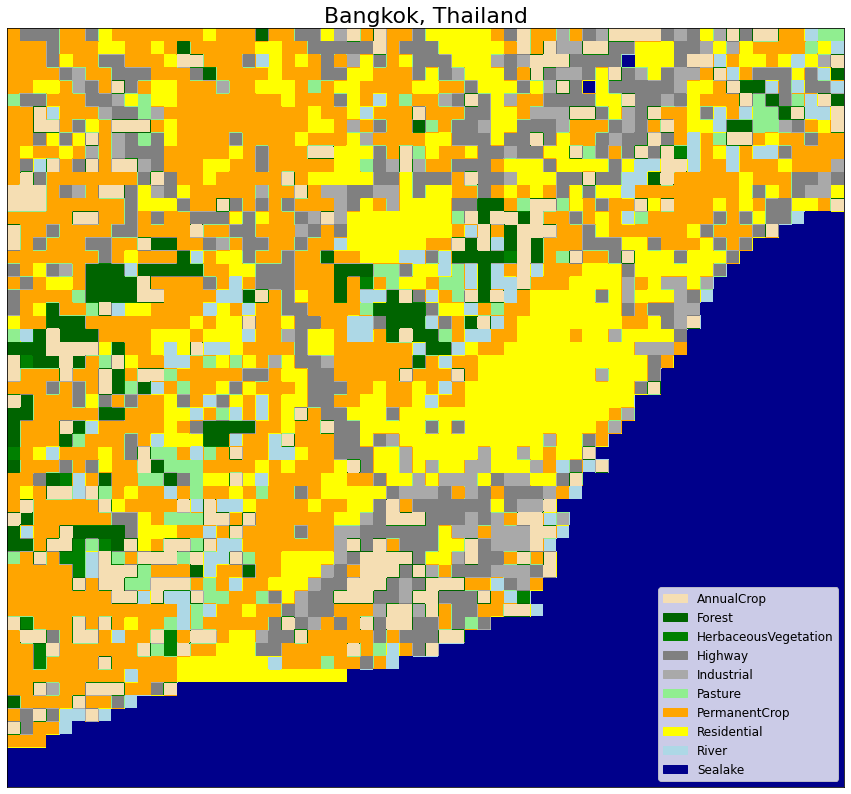

In [16]:
input_data = get_net_input(normalize_image(img))
pred = get_predicitons(input_data)
plot_result(pred, org_shape, 'Barcelona, Spain')

# Abu Dhabi

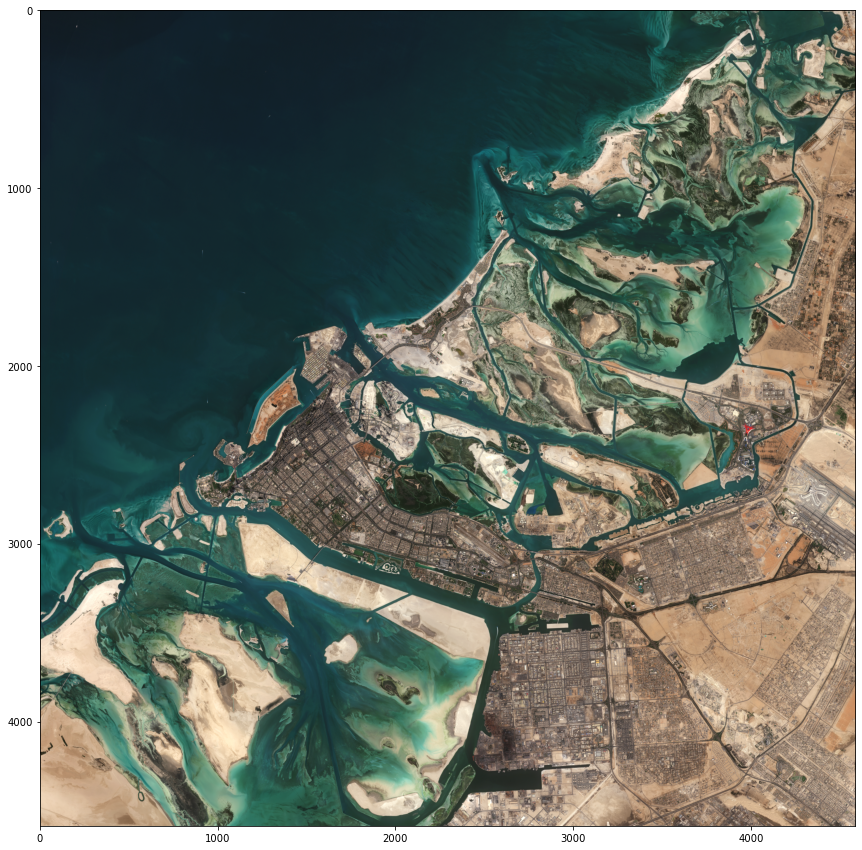

In [27]:
rgb_path = '../../images/abudhabi.tif'
img = plt.imread(rgb_path)
org_shape = img.shape
plt.figure(figsize=(15,15))
plt.imshow(img);

Chunk: 100%|██████████| 11/11 [00:20<00:00,  1.87s/it]


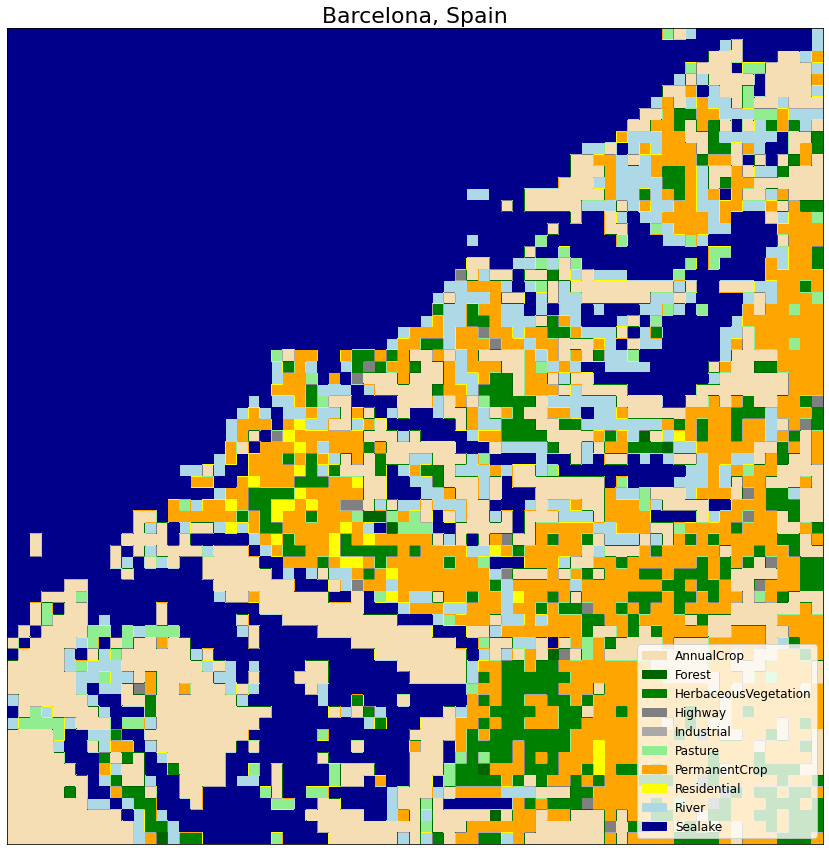

In [28]:
input_data = get_net_input(normalize_image(img))
pred = get_predicitons(input_data)
plot_result(pred, org_shape, 'Abu. Dhabi')